# Adversarial Attack and Detection in Medical Images using Deap Learning

## Imports
Import common libraries and packages.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
%load_ext autoreload
%autoreload 2

## Partition of data
Partitions the data based on the .csv file with file names of images and their corresponding name into three different .csv files for training, validation and testing under the folder `/data`. You can specify the ratios of training, validation and test data sets

Once partitioned into these three .csv files, one can use the same partitioning over and over when implementing the model, so to have comparative results.

In [2]:
# # Imports
# from data import partition_data

# # Partition data into training, validation and test sets
# partition_data(file='data/data_labels.csv', ratios=[0.70, 0.15, 0.15], out_path='data/')

## Import and transform data
Import the data and possibly augment it.

### Compute mean and standard deviation of data
Compute mean and standard deviation of training data after the pixels have been normalized to [0,1]. Once computed for a given training data set, there's no need to recalculate. Thus, use the computed values in the next cell.

In [3]:
# # Imports
# import albumentations as album
# from albumentations.pytorch import ToTensorV2
# from data import DatasetFromCSV, compute_mean_std



# # Settings
# image_size = 400

# # Compute mean and standard deviation of images in training data
# album_init = album.Compose([album.Resize(image_size, image_size),
#                             album.Normalize(mean=[0,0,0], std=[1,1,1]),
#                             ToTensorV2()])
# dataset_train = DatasetFromCSV(image_root='./data/data_images/',
#                                csv_path='./data/data_labels_train.csv',
#                                transforms=album_init)
# dataset_train_mean, dataset_train_std = compute_mean_std(dataset_train)
# print(dataset_train_mean, dataset_train_std)

Computed mean and standard deviation for training data:

In [2]:
# Saved means and stds
dataset_train_mean = torch.tensor([0.7750, 0.5888, 0.7629])
dataset_train_std = torch.tensor([0.2129, 0.2971, 0.1774])

### Import training and validation data
Import training and validation datasets and put into data loaders. Specify what image size should be used and what augmentations of the data that is executed using the library albumentations. Also plot some examples from each data set.

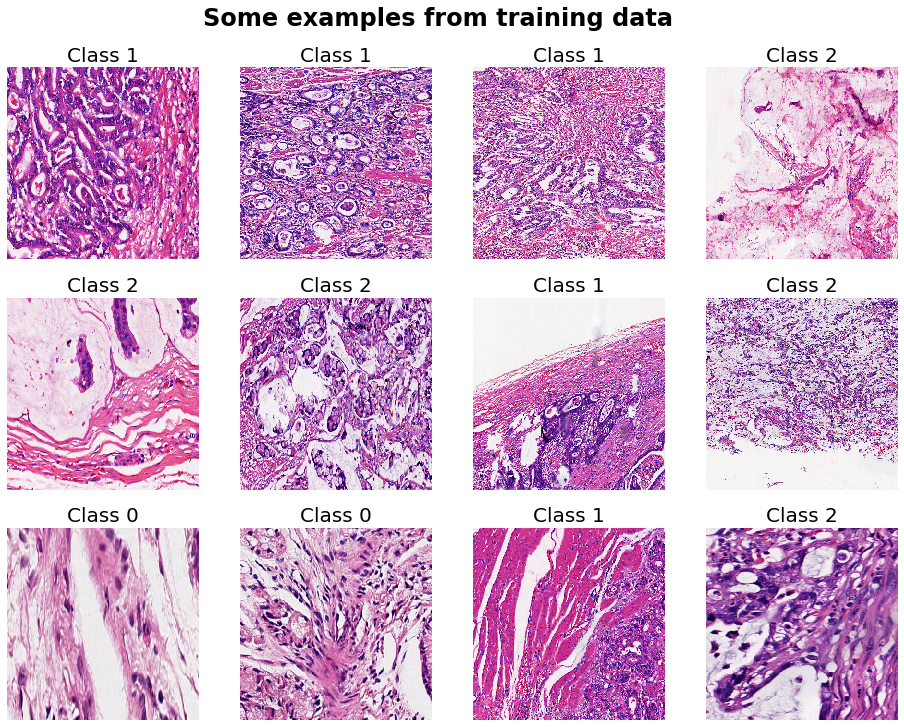

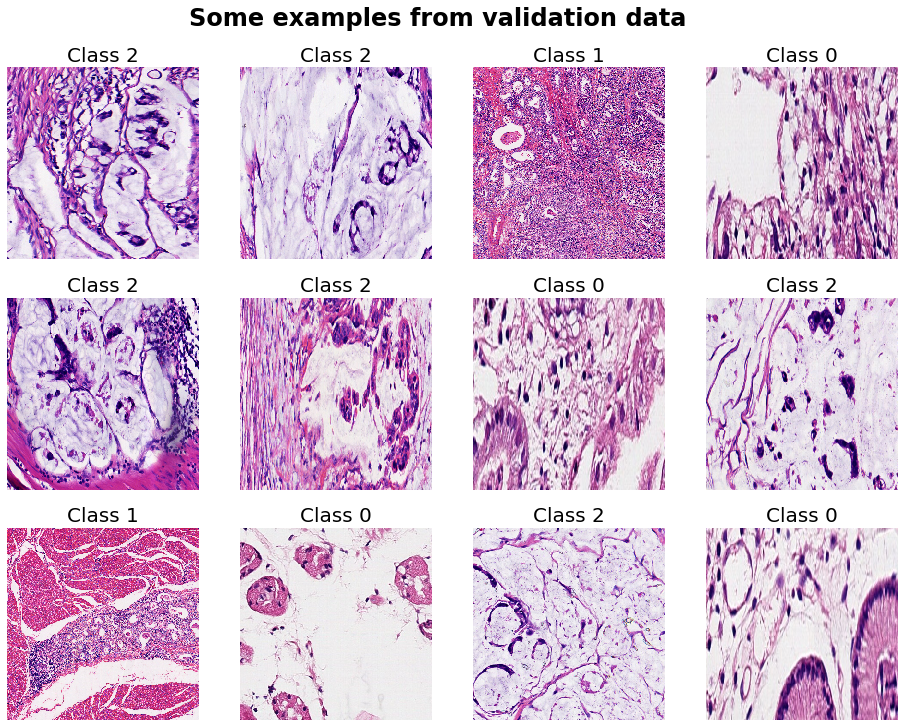

In [3]:
# Imports
import cv2
import albumentations as album
from albumentations.augmentations.transforms import GaussianBlur, MedianBlur, MotionBlur, RandomBrightness, \
                                                    RandomContrast,  VerticalFlip
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
import torchvision
import torch
from data import DatasetFromCSV, compute_mean_std
from plot import plot_dataset, plot_image_list



# Settings
image_size = 400
batch_size = 16
num_workers = 4


# Augmentations of images and data using albumentations
album_train = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

album_validation = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])


# Load training data set
dataset_train = DatasetFromCSV(image_root='./data/data_images/',
                               csv_path='./data/data_labels_train.csv',
                               transforms=album_train)
# Load validation data set
dataset_validation = DatasetFromCSV(image_root='./data/data_images/',
                                    csv_path='./data/data_labels_validation.csv',
                                    transforms=album_validation)


# Plot some examples from training and validation data sets
rows = 3
cols = 4
image_width = 4
fig, axs = plot_dataset(dataset_train, rows=rows, cols=cols, image_width=image_width,
                        mean=dataset_train_mean, std=dataset_train_std)
fig.suptitle('Some examples from training data', fontsize=24, y=0.95, weight='bold')
fig, axs = plot_dataset(dataset_validation, rows=rows, cols=cols, image_width=image_width,
                        mean=dataset_train_mean, std=dataset_train_std)
fig.suptitle('Some examples from validation data', fontsize=24, y=0.95, weight='bold')
plt.show()


# Load data into loaders
loader_train = DataLoader(dataset=dataset_train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
loader_validation = DataLoader(dataset=dataset_validation, batch_size=batch_size, num_workers=num_workers)

## Train classifier
Train classifier on training data and save models based on validation results. Can also load pre-trained models. During training, logs are saved and can be viewed via Tensorboard.

In [6]:
# Imports
import os
import time
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')
import torch
from torch.utils.tensorboard import SummaryWriter
from models.efficientnet import EfficientNet
from core import core_efficientnet
from utils import create_save_path, SaveBestModel



# Settings
session = 1
num_classes = 3
initial_lr = 0.01
epochs = 100
load_model = True
save_path = './checkpoints/'+str(datetime.date(datetime.now()))+'_'+\
            str(image_size)+'x'+str(image_size)+'_'+str(epochs)+'_'+str(session)


# Use trained model
if load_model:
    model = torch.load('./checkpoints/2021-11-05_400x400_100_1/models/last.pt')
    
    # Device
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Loss function
    loss_func = torch.nn.CrossEntropyLoss().to(device)

    # Optimizer
    optimizer = torch.optim.Adam(lr=initial_lr, params=model.parameters(), betas=(0.9, 0.99))

# Train model
else:
    # Model
    model = EfficientNet.from_name('efficientnet-b0', num_classes=num_classes)

    # Device
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Loss function
    loss_func = torch.nn.CrossEntropyLoss().to(device)

    # Optimizer
    optimizer = torch.optim.Adam(lr=initial_lr, params=model.parameters(), betas=(0.9, 0.99))

    # Learning rate decay
    optimizer_step = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-5)

    # Weight save path
    log_path, weight_path = create_save_path(save_path)

    # Initialize log writer
    log_writer = SummaryWriter(log_path, comment=f'LR_{initial_lr}_BS_{batch_size}')

    # Save current model as best model
    save_best_model = SaveBestModel(epoch=None, model=model, epochs=epochs, monitor_value=None, weight_path=weight_path,
                                    best=None)

    # Setup
    train_total = len(dataset_train)
    valid_total = len(dataset_validation)
    time_start = time.time()

    print('Started:', str(datetime.now()))
    for epoch in range(epochs):
        print('Epoch {:<3}'.format(epoch+1), end='   ')
        
        # Training
        train_acc, train_loss = core_efficientnet.train(model, loader_train, device, loss_func, optimizer, train_total, epoch)
        print('Training accuracy: {:>3}%, loss: {:<5}'.format(
            np.around(100*train_acc,2),
            np.around(train_loss,5)),
            end='   ')

        # Validation
        valid_acc, valid_loss = core_efficientnet.valid(model, loader_validation, device, loss_func, optimizer, valid_total,
                                                        epoch)
        print('Validation accuracy: {:>3}%, loss: {:<5}'.format(
            np.around(100*valid_acc,2),
            np.around(valid_loss,5)),
            end='\n')

        # Optimize
        optimizer_step.step()
        lr = optimizer.param_groups[0]['lr']

        # Save model if better than previously best model
        save_best_model.epoch = epoch
        save_best_model.monitor_value = valid_acc
        save_best_model.run(model)

        # Write to log
        log_writer.add_scalar("Train/Training_accuracy", train_acc, epoch)
        log_writer.add_scalar("Train/Validation_accuracy", valid_acc, epoch)
        log_writer.add_scalar("Train/Training_loss", train_loss, epoch)
        log_writer.add_scalar("Train/Validation_loss", valid_loss, epoch)
        log_writer.add_scalar("Train/Learning_rate", lr, epoch)

    time_elapsed = time.time() - time_start
    print('Ended:', str(datetime.now()))
    print('Total training time: {}'.format(str(timedelta(seconds=time_elapsed))))

## Test
Use trained model and get results for test data.

In [7]:
from plot import plot_dataset, plot_image_list

# Augmentations of images and data using albumentations
album_test = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

# Load test data set
dataset_test = DatasetFromCSV(image_root='./data/data_images/',
                              csv_path='./data/data_labels_test.csv',
                              transforms=album_test)

# Load data into loaders
loader_test = DataLoader(dataset=dataset_test, batch_size=batch_size, num_workers=num_workers)

# Test
test_total = len(dataset_test)
test_acc, test_loss, wrong_images, wrong_labels, correct_labels = \
    core_efficientnet.test(model, loader_test, device, loss_func, optimizer, test_total, epoch=1)

print('Test accuracy:   '+str(np.around(100*test_acc,2))+'%')
print('Test loss:       '+str(np.around(test_loss,5)))

Test accuracy:   96.24%
Test loss:       0.1837


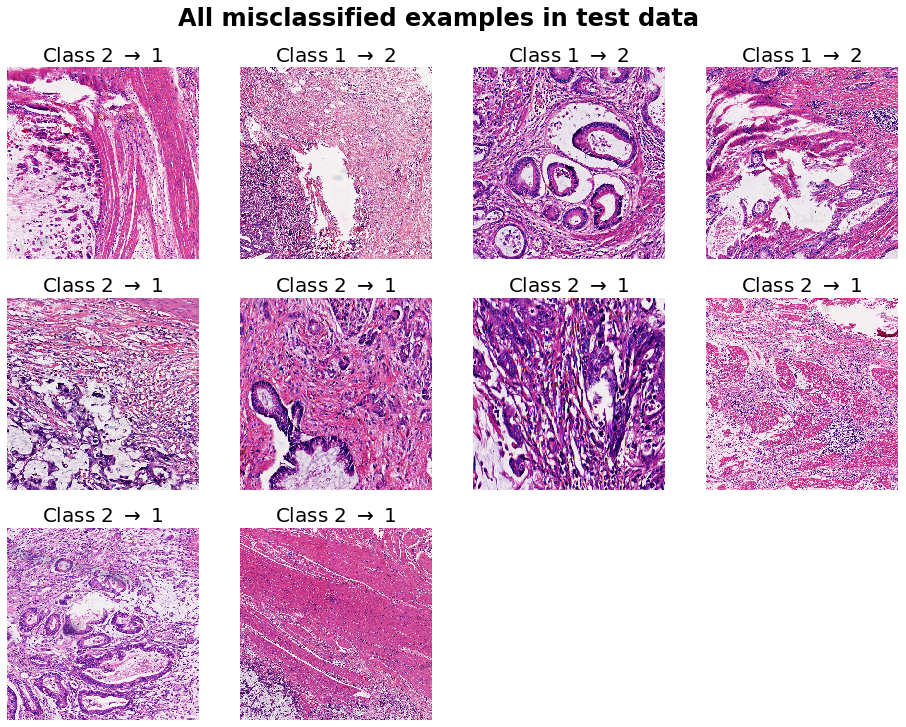

In [8]:
# Plot misclassified samples
rows = 3
cols = 4
image_width = 4
fig, axs = plot_image_list(wrong_images, wrong_labels, correct_labels, rows=rows, cols=cols, image_width=image_width,
                        mean=dataset_train_mean, std=dataset_train_std)
fig.suptitle('All misclassified examples in test data', fontsize=24, y=0.95, weight='bold')
plt.show()

## Attacks

In [ ]:
class Attack:
    def __init__(self, name, model, mean, std):
        self.name = name
        self.model = model
        self.mean = mean
        self.std = std
        self.targeted = False
        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        self.loss_function = torch.nn.CrossEntropyLoss()
    
    def attack(self, *input):
        """
        Function to be implemented for each attack type.
        """
        raise NotImplementedError
    
    def clamp(self, images):
        """
        Clamp image to min and max values based on mean and standard devation
        for each individual RGB value from training data set.
        """
        clamp_min = torch.div(-self.mean, self.std)
        clamp_max = torch.div(1.0 - self.mean, self.std)
        for i, (cmin, cmax) in enumerate(zip(clamp_min, clamp_max)):
            images[:,i,:,:] = torch.clamp(input=images[:,i,:,:], min=cmin, max=cmax)
        return images
    
    def get_targeted_labels(self, labels):
        """
        Draw targeted label uniformly from other labels than the actual one.
        """
        targeted_labels = labels.clone()
        for i, label in enumerate(labels):
            targets = [0, 1, 2]
            targets.remove(int(label))
            targeted_labels[i] = np.random.choice(targets)
        return targeted_labels
        

class FGSM(Attack):
    def __init__(self, model, epsilon=0.007, targeted=False, mean=0.0, std=1.0):
        super().__init__('FGSM', model, mean, std)
        self.epsilon = epsilon
        self.targeted = targeted
    
    def attack(self, images, labels):
        """
        FGSM attack algorithm.
        """
        images = images.clone().detach().to(self.device)
        labels = labels.clone().detach().to(self.device)
        loss = self.loss_function.to(self.device)
        
        if self.targeted:
            targeted_labels = self.get_targeted_labels(labels)
        else:
            targeted_labels = None
        
        images.requires_grad = True
        
        outputs = self.model(images)
        if self.targeted:
            cost = -loss(outputs, targeted_labels)
        else:
            cost = loss(outputs, labels)
        
        gradients = torch.autograd.grad(cost, images, retain_graph=False, create_graph=False)[0]
        attacked_images = images + self.epsilon*gradients.sign()
        attacked_images = self.clamp(attacked_images).detach()
            
        return attacked_images, gradients.sign(), targeted_labels

    
class IFGSM(Attack):
    def __init__(self, model, epsilon=0.007, steps=2, targeted=False, mean=0.0, std=1.0):
        super().__init__('FGSM', model, mean, std)
        self.epsilon = epsilon
        self.steps = steps
        self.targeted = targeted
    
    def attack(self, images, labels):
        """
        IFGSM attack algorithm.
        """
        images = images.clone().detach().to(self.device)
        labels = labels.clone().detach().to(self.device)
        loss = self.loss_function.to(self.device)
        
        if self.targeted:
            targeted_labels = self.get_targeted_labels(labels)
        else:
            targeted_labels = None
        
        gradients_sum = 0
        
        for step in range(self.steps):
            images.requires_grad = True
            
            outputs = self.model(images)
            if self.targeted:
                cost = -loss(outputs, targeted_labels)
            else:
                cost = loss(outputs, labels)

            gradients = torch.autograd.grad(cost, images, retain_graph=False, create_graph=False)[0]
            attacked_images = images + (self.epsilon/self.steps)*gradients.sign()
            attacked_images = self.clamp(attacked_images).detach()
            
            gradients_sum = gradients_sum + gradients.sign()

        return attacked_images, gradients_sum/steps, targeted_labels
    
    

    
def convert_image(image, mean, std):
    image = image.permute(1,2,0).numpy()
    mean_inv = torch.div(-mean, std)
    std_inv = torch.div(1, std)
    album_inv = album.Compose([album.Normalize(mean=mean_inv, std=std_inv, max_pixel_value=1.0)])
    image = album_inv(image=image)['image']
    return image
        
def plot_attacks(rows, images, labels, init_labels, attacked_images, attacked_labels, gradients,
                 epsilon, mean, std, targeted_labels=None):
    fig, axs = plt.subplots(rows, 3, figsize=(15,5*rows))
    for i, (img, lbl, init_lbl, att_img, att_lbl, grad) in enumerate(
        zip(images, labels, init_labels, attacked_images, attacked_labels, gradients)):
        ax = axs[i]
        img = convert_image(img, mean, std)
        grad = convert_image(grad, torch.Tensor([0.5, 0.5, 0.5]), torch.Tensor([0.5, 0.5, 0.5]))
        att_img = convert_image(att_img, mean, std)
        ax[0].imshow(img)
        ax[0].set_title(r'Class {} $\rightarrow$ {}'.format(lbl, init_lbl), fontsize=20)
        ax[1].imshow(grad)
        ax[1].set_title('Attack with $\epsilon='+str(epsilon)+'$', fontsize=20)
        ax[2].imshow(att_img)
        ax[2].set_title(r'Class {} $\rightarrow$ {}{}'.format(lbl, att_lbl,
            ' (target '+str(int(targeted_labels[i]))+')' if targeted_labels is not None else ''), fontsize=20)
        for a in ax:
            a.axis('off')
        if i >= rows-1:
            break
    return fig, axs

def evaluate_attacks(model, labels, attacked_images, attacked_labels, targeted_labels=None):
    print('RESULTS OF ATTACKS')
    print('  Labels:            ', labels)
    print('  Attacked labels:   ', attacked_labels)
    print('                     ', (attacked_labels==labels).type(torch.uint8))
    print('  Accuracy:          ', np.count_nonzero(attacked_labels==labels)*100/batch_size)
    if targeted_labels is not None:
        print('  Targeted labels:   ', targeted_labels)
        print('                     ', (attacked_labels==targeted_labels).type(torch.uint8))
        print('  Accuarcy targeted: ', np.count_nonzero(attacked_labels==targeted_labels)*100/batch_size)



# Load mean and standard deviation of data
dataset_train_mean = torch.tensor([0.7750, 0.5888, 0.7629])
dataset_train_std = torch.tensor([0.2129, 0.2971, 0.1774])

# Load trained model
model = torch.load('./checkpoints/2021-11-05_400x400_100_1/models/last.pt')
    
# Augmentations of images and data using albumentations
album_attack = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

# Load test data set
batch_size = 50
dataset_attack = DatasetFromCSV(image_root='./data/data_images/',
                                csv_path='./data/data_labels_test.csv',
                                transforms=album_attack)
loader_attack = DataLoader(dataset=dataset_attack, batch_size=batch_size, shuffle=True)

# Get first batch to test on
images, labels = next(iter(loader_attack))[0]['image'], next(iter(loader_attack))[1]
init_labels = model(images).max(1, keepdim=False)[1]

# Set up attack
epsilon = 0.25
steps = 10
targeted = True

# Initialize attacks
fgsm = FGSM(model=model, epsilon=epsilon, targeted=targeted, mean=dataset_train_mean, std=dataset_train_std)
ifgsm = IFGSM(model=model, epsilon=epsilon, steps=steps, targeted=targeted, mean=dataset_train_mean, std=dataset_train_std)
attacker = ifgsm

# Attack images
attacked_images, gradients, targeted_labels = attacker.attack(images, labels)
attacked_labels = model(attacked_images).max(1, keepdim=False)[1]

# Evaluate attacks
evaluate_attacks(model, labels, attacked_images, attacked_labels, targeted_labels=targeted_labels)

# Plot attacks
plot_attacks(5, images, labels, init_labels, attacked_images, attacked_labels, gradients,
             epsilon=epsilon, mean=dataset_train_mean, std=dataset_train_std, targeted_labels=targeted_labels)
plt.show()

# OLD CODE BELOW

## Attack (FGSM and I-FGSM)

In [342]:
import numpy as np
import matplotlib.pyplot as plt


from plot import plot_dataset, plot_image_list
import torch
import albumentations as album
from albumentations.pytorch import ToTensorV2
from data import DatasetFromCSV
from torch.utils.data import Dataset, DataLoader


def adv_attack_fgsm(image, epsilon, gradient, random_noise=False):
    """
    Adversarial attack using Fast Gradient Sign Method.
    :param image:    input image to attack
    :param epsilon:  amount to perturb the image by
    :param gradient: gradient of the loss with respect to the input image
    """
    gradient_sign = gradient.sign()
    if random_noise:
        gradient_sign = np.sign(torch.Tensor(np.random.normal(size=(1,3,400,400))))
    perturbed_image = image + epsilon*gradient_sign
    return perturbed_image, gradient_sign

def adv_attack_fgsm_helper(model, loss_func, dataset, epsilon, steps=1, num_to_attack=None, random_noise=False):
    """
    Helper function perform adversarial attacks on data set.
    Inspired by tutorial on pytorch.org: https://pytorch.org/tutorials/beginner/fgsm_tutorial.html
    :param model:         trained model to compute gradients and predict with
    :param loss_func:     loss function to use
    :param dataset:       dataset with images and labels
    :param epsilon:       amount to perturb the images by
    :param steps:         steps 1 is FGSM and >1 is I-FGSM
    :param num_to_attack: if to use less samples than size of data set
    :param random_noise:  if to use random Gaussian noise as baseline reference
    """
    
    # Load data
    loader = DataLoader(dataset=dataset, batch_size=1)
    
    # Setup
    correct = 0           # counter for correct classifications
    adv_attacks = []      # list holding adversarial attacks and other information
    if num_to_attack is None: num_to_attack = len(loader)
    
    # Print info
    print('Starting adversarial attacks with FGMS for', len(loader), 'images:')
    
    # Iterate over all images to attack
    for i, (data, label) in enumerate(loader):
        
        # Prepare data by sending it to device
        image = data['image']
        image, label = image.to(device), label.to(device)
        
        # Enable to compute gradient for tensor
        image.requires_grad = True
        
        # Save original image and make initial prediction
        image_orig = image.clone()
        output = model(image_orig)
        init_pred = output.max(1, keepdim=True)[1]
            
        # Compute loss using the defined loss function
        loss = loss_func(output, label)
        
        # Set existing gradient to zero
        model.zero_grad()
        
        # Calculate the gradients of the model in backward pass
        loss.backward()
        
        # Get the gradient with respect to the data
        image_grad = image.grad.data
        
        # Attack the image using FGSM
        adv_image, gradient_sign = adv_attack_fgsm(image, epsilon/steps, image_grad, random_noise=random_noise)
        image = adv_image.detach()
        
        for step in range(1, steps):
            image.requires_grad = True
            output = model(image)
            model.zero_grad()
            loss = loss_func(output, label)
            loss.backward()
            image_grad = image.grad.data
            adv_image, adv_gradient_sign = adv_attack_fgsm(image, epsilon/steps, image_grad, random_noise=random_noise)
            gradient_sign = gradient_sign + adv_gradient_sign
            image = adv_image.detach()
        
        # Compute mean gradient sign
        gradient_sign = gradient_sign/steps
        
        # Rename attack image
        perturbed_image = image

        # Get the prediction of the perturbed/attacked image
        perturbed_output = model(perturbed_image)
        perturbed_pred = perturbed_output.max(1, keepdim=True)[1]
        
        # Check if attack caused wrongful prediction or not
        if perturbed_pred.item() == label.item():
            print('.', end='')
            
            # If predicted label is still correct, increase correct by 1
            correct += 1
            
            # Special case for saving adversarial attacks when epsilon is zero
            if epsilon == 0:
                adv_attacks.append((image_orig[0,:,:,:].clone().squeeze().detach().cpu(),
                                    perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                    gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                    label.item(), init_pred.item(), perturbed_pred.item()))
                
        # Otherwise, the attack was successful and add it to list with adversarial attacks
        else:
            print('x', end='')
            adv_attacks.append((image_orig[0,:,:,:].clone().squeeze().detach().cpu(),
                                perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                label.item(), init_pred.item(), perturbed_pred.item()))
            
        # If to break earlier than the whole test set
        if i >= num_to_attack-1:
            break
            
    # Compute accuracy and print results
    final_acc = correct/float(num_to_attack)
    print('\nDone.')
    print("Epsilon: {}\tTest Accuracy = {}/{} = {}".format(epsilon, correct, num_to_attack, final_acc))
    
    # Return adversarial attacks and accuracy
    return adv_attacks, final_acc


    
    
# Saved means and stds
dataset_train_mean = torch.tensor([0.7750, 0.5888, 0.7629])
dataset_train_std = torch.tensor([0.2129, 0.2971, 0.1774])

image_size = 400

# Load trained model
model = torch.load('./checkpoints/2021-11-05_400x400_100_1/models/last.pt')

# Device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Loss function
loss_func = torch.nn.CrossEntropyLoss().to(device)
    
# Augmentations of images and data using albumentations
album_attack = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

# Load test data set
dataset_attack = DatasetFromCSV(image_root='./data/data_images/',
                                csv_path='./data/data_labels_test.csv',
                                transforms=album_attack)

epsilon = 0.05
steps = 1
num_to_attack = 50 # Use None to use all samples
adv_attacks, final_acc = adv_attack_fgsm_helper(model, loss_func, dataset_attack, epsilon, steps=steps,
                                                num_to_attack=num_to_attack, random_noise=False)

Starting adversarial attacks with FGMS for 266 images:
...x..x.x..xxxx.x.xxxxxxx...x.xx.x.x..x...xx..xxxx
Done.
Epsilon: 0.05	Test Accuracy = 23/50 = 0.46


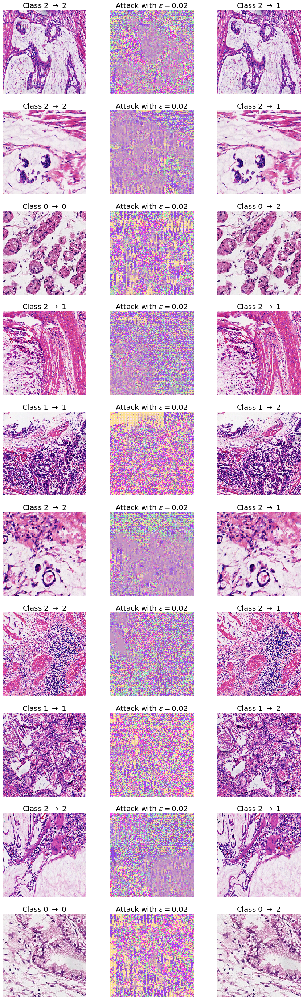

In [199]:
def convert_image(img, mean, std):
    img = img.permute(1,2,0).numpy()
    mean_inv = torch.div(-mean, std)
    std_inv = torch.div(1, std)
    album_inv = album.Compose([album.Normalize(mean=mean_inv, std=std_inv, max_pixel_value=1.0)])
    img = album_inv(image=img)['image']
    return img
    
def plot_attacks(rows, adv_attacks, epsilon, mean, std):
    fig, axs = plt.subplots(rows, 3, figsize=(15,5*rows))
    for i, (img, adv_img, grad, lbl, lbl_init, adv_lbl) in enumerate(adv_attacks):
        ax = axs[i]
        img = convert_image(img, mean, std)
        grad = convert_image(grad, mean, std)
        adv_img = convert_image(adv_img, mean, std)
        ax[0].imshow(img)
        ax[0].set_title(r'Class {} $\rightarrow$ {}'.format(lbl, lbl_init), fontsize=20)
        ax[1].imshow(grad)
        ax[1].set_title('Attack with $\epsilon='+str(epsilon)+'$', fontsize=20)
        ax[2].imshow(adv_img)
        ax[2].set_title(r'Class {} $\rightarrow$ {}'.format(lbl, adv_lbl), fontsize=20)
        for a in ax:
            a.axis('off')
        if i >= rows-1:
            break
    return fig, axs

fig, axs= plot_attacks(rows=10, adv_attacks=adv_attacks, epsilon=epsilon,
                       mean=dataset_train_mean, std=dataset_train_std)
plt.show()

# OLD TEST CODE BELOW

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


from plot import plot_dataset, plot_image_list
import torch
import albumentations as album
from albumentations.pytorch import ToTensorV2
from data import DatasetFromCSV
from torch.utils.data import Dataset, DataLoader


def adv_attack_fgsm(image, epsilon, gradient, random_noise=False):
    """
    Adversarial attack using Fast Gradient Sign Method.
    :param image:    input image to attack
    :param epsilon:  amount to perturb the image by
    :param gradient: gradient of the loss with respect to the input image
    """
    gradient_sign = gradient.sign()
    if random_noise:
        gradient_sign = np.sign(torch.Tensor(np.random.normal(size=(1,3,400,400))))
    perturbed_image = image + epsilon*gradient_sign
    return perturbed_image, gradient_sign

def adv_attack_fgsm_helper(model, loss_func, dataset, epsilon, num_to_attack=None, random_noise=False):
    """
    Helper function perform adversarial attacks on data set.
    Inspired by tutorial on pytorch.org: https://pytorch.org/tutorials/beginner/fgsm_tutorial.html
    :param model:   trained model to compute gradients and predict with
    :param dataset: dataset with images and labels
    :param epsilon: amount to perturb the images by
    """
    # Load data
    loader = DataLoader(dataset=dataset, batch_size=1)
    
    # Setup
    correct = 0           # counter for correct classifications
    adv_attacks = []      # list holding adversarial attacks
    if num_to_attack is None: num_to_attack = len(loader)
    
    # Print info
    print('Starting adversarial attacks with FGMS for', len(loader), 'images', end='')
    
    # Iterate over all images to attack
    for i, (data, label) in enumerate(loader):
        # Print a dot for each attack
        # Prepare data by sending it to device
        image = data['image']
        image, label = image.to(device), label.to(device)
        # Enable to compute gradient for tensor
        image.requires_grad = True
        # Forward pass data through model
        output = model(image)
        # Get initial prediction of label from model
        init_pred = output.max(1, keepdim=True)[1]
        # If the initial prediction of label is wrong, do not try and attack
        if init_pred.item() != label.item():
            print('!', end='')
            continue
        # Compute loss using the defined loss function
        loss = loss_func(output, label)
        # Set existing gradient to zero
        model.zero_grad()
        # Calculate the gradients of the model in backward pass
        loss.backward()
        # Get the gradient with respect to the data
        image_grad = image.grad.data
        # Attack the image using FGSM
        perturbed_image, gradient_sign = adv_attack_fgsm(image, epsilon, image_grad, random_noise=random_noise)
        # Get the prediction of the perturbed/attacked image
        perturbed_output = model(perturbed_image)
        perturbed_pred = perturbed_output.max(1, keepdim=True)[1]
        # Check if attack caused wrongful prediction or not
        if perturbed_pred.item() == label.item():
            print('.', end='')
            # If predicted label is still correct, increase correct by 1
            correct += 1
            # Special case for saving adversarial attacks when epsilon is zero
            if epsilon == 0:
                adv_attacks.append((image[0,:,:,:].clone().squeeze().detach().cpu(),
                                    perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                    gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                    label.item(), init_pred.item(), perturbed_pred.item()))
        # Otherwise, the attack was successful and add it to list with adversarial attacks
        else:
            print('x', end='')
            adv_attacks.append((image[0,:,:,:].clone().squeeze().detach().cpu(),
                                perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                label.item(), init_pred.item(), perturbed_pred.item()))
        # If to break earlier than the whole test set
        if i >= num_to_attack-1:
            break
            
    # Compute accuracy and print results
    final_acc = correct/float(num_to_attack)
    print(' done.')
    print("Epsilon: {}\tTest Accuracy = {}/{} = {}".format(epsilon, correct, num_to_attack, final_acc))
    
    # Return adversarial attacks and accuracy
    return adv_attacks, final_acc


    
    
# Saved means and stds
dataset_train_mean = torch.tensor([0.7750, 0.5888, 0.7629])
dataset_train_std = torch.tensor([0.2129, 0.2971, 0.1774])

image_size = 400

# Load trained model
model = torch.load('./checkpoints/2021-11-05_400x400_100_1/models/last.pt')

# Device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Loss function
loss_func = torch.nn.CrossEntropyLoss().to(device)
    
# Augmentations of images and data using albumentations
album_attack = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

# Load test data set
dataset_attack = DatasetFromCSV(image_root='./data/data_images/',
                                csv_path='./data/data_labels_test.csv',
                                transforms=album_attack)

epsilon = 0.05
num_to_attack = None # Use None to use all samples
adv_attacks, final_acc = adv_attack_fgsm_helper(model, loss_func, dataset_attack, epsilon, num_to_attack=num_to_attack,
                                                random_noise=False)

In [ ]:
def convert_image(img, mean, std):
    img = img.permute(1,2,0).numpy()
    mean_inv = torch.div(-mean, std)
    std_inv = torch.div(1, std)
    album_inv = album.Compose([album.Normalize(mean=mean_inv, std=std_inv, max_pixel_value=1.0)])
    img = album_inv(image=img)['image']
    return img
    
def plot_attacks(rows, adv_attacks, epsilon, mean, std):
    fig, axs = plt.subplots(rows, 3, figsize=(15,5*rows))
    for i, (img, adv_img, grad, lbl, lbl_init, adv_lbl) in enumerate(adv_attacks):
        ax = axs[i]
        img = convert_image(img, mean, std)
        grad = convert_image(grad, mean, std)
        adv_img = convert_image(adv_img, mean, std)
        ax[0].imshow(img)
        ax[0].set_title(r'Class {} $\rightarrow$ {}'.format(lbl, lbl_init), fontsize=20)
        ax[1].imshow(grad)
        ax[1].set_title('Attack with $\epsilon='+str(epsilon)+'$', fontsize=20)
        ax[2].imshow(adv_img)
        ax[2].set_title(r'Class {} $\rightarrow$ {}'.format(lbl, adv_lbl), fontsize=20)
        for a in ax:
            a.axis('off')
        if i >= rows-1:
            break
    return fig, axs


fig, axs= plot_attacks(rows=10, adv_attacks=adv_attacks, epsilon=epsilon,
                       mean=dataset_train_mean, std=dataset_train_std)
# fig.suptitle('Adversarial attack examples using FGSM', fontsize=24, y=0.95, weight='bold')
plt.show()

## Different epsilon

Starting adversarial attacks with FGMS for 266 images.......................................................................................................................................................................................................................................................................... done.
Epsilon: 0.0	Test Accuracy = 256/266 = 0.9624060150375939
Starting adversarial attacks with FGMS for 266 images.......................................................................................................................................................................................................................................................................... done.
Epsilon: 0.00392156862745098	Test Accuracy = 243/266 = 0.9135338345864662
Starting adversarial attacks with FGMS for 266 images...................................................................................................................................................................

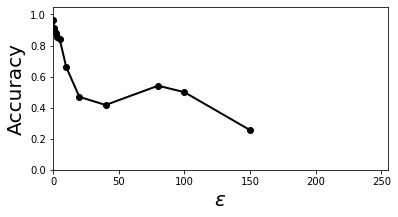

In [62]:
epsilons = np.array([0, 1, 2, 3, 5, 10, 20, 40, 80, 100, 150])
num_to_attack = None # Use None to use all samples
final_accs = []
for epsilon in epsilons/255:
    adv_attacks, final_acc = adv_attack_fgsm_helper(model, loss_func, dataset_attack, epsilon, num_to_attack=num_to_attack)
    final_accs.append(final_acc)

fig, ax = plt.subplots(1, 1, figsize=(6,3))
ax.plot(epsilons, final_accs, 'k-o', linewidth=2)
ax.set_xlim([0,255])
ax.set_ylim([0,1.05])
ax.set_xlabel('$\epsilon$', fontsize=20)
ax.set_ylabel('Accuracy', fontsize=20)
plt.show()

## I-FGSM

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


from plot import plot_dataset, plot_image_list
import torch
import albumentations as album
from albumentations.pytorch import ToTensorV2
from data import DatasetFromCSV
from torch.utils.data import Dataset, DataLoader


def adv_attack_ifgsm(image, epsilon, gradient, random_noise=False):
    """
    Adversarial attack using Fast Gradient Sign Method.
    :param image:    input image to attack
    :param epsilon:  amount to perturb the image by
    :param gradient: gradient of the loss with respect to the input image
    """
    gradient_sign = gradient.sign()
    if random_noise:
        gradient_sign = np.sign(torch.Tensor(np.random.normal(size=(1,3,400,400))))
    perturbed_image = image + epsilon*gradient_sign
    return perturbed_image, gradient_sign

def adv_attack_ifgsm_helper(model, loss_func, dataset, epsilon, num_to_attack=None, random_noise=False):
    """
    Helper function perform adversarial attacks on data set.
    Inspired by tutorial on pytorch.org: https://pytorch.org/tutorials/beginner/fgsm_tutorial.html
    :param model:   trained model to compute gradients and predict with
    :param dataset: dataset with images and labels
    :param epsilon: amount to perturb the images by
    """
    # Load data
    loader = DataLoader(dataset=dataset, batch_size=1)
    
    # Setup
    steps = 10
    correct = 0           # counter for correct classifications
    adv_attacks = []      # list holding adversarial attacks
    if num_to_attack is None: num_to_attack = len(loader)
    
    # Print info
    print('Starting adversarial attacks with FGMS for', len(loader), 'images', end='')
    
    # Iterate over all images to attack
    for i, (data, label) in enumerate(loader):
        # Print a dot for each attack
        # Prepare data by sending it to device
        image = data['image']
        image, label = image.to(device), label.to(device)
        # Save original image
        image_orig = image.clone()
        init_output = model(image_orig)
        init_pred = init_output.max(1, keepdim=True)[1]
        gradient_signs = 0
        for step in range(steps):
#             print('step:', step)
            # Enable to compute gradient for tensor
            image.requires_grad = True
            output = model(image)
            # Set existing gradient to zero
            model.zero_grad()
            # Compute loss using the defined loss function
            loss = loss_func(output, label)
            # Calculate the gradients of the model in backward pass
            loss.backward()
            # Get the gradient with respect to the data
            image_grad = image.grad.data
            # Attack the image using FGSM
            adv_image, gradient_sign = adv_attack_ifgsm(image, epsilon/steps, image_grad, random_noise=random_noise)
            gradient_signs = gradient_signs + gradient_sign
            image = adv_image.detach()
        gradient_sign = gradient_signs / steps
        perturbed_image = image
        # Get the prediction of the perturbed/attacked image
        perturbed_output = model(perturbed_image)
        perturbed_pred = perturbed_output.max(1, keepdim=True)[1]
        # Check if attack caused wrongful prediction or not
        if perturbed_pred.item() == label.item():
            print('.', end='')
            # If predicted label is still correct, increase correct by 1
            correct += 1
            # Special case for saving adversarial attacks when epsilon is zero
            if epsilon == 0:
                adv_attacks.append((image_orig[0,:,:,:].clone().squeeze().detach().cpu(),
                                    perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                    gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                    label.item(), init_pred.item(), perturbed_pred.item()))
        # Otherwise, the attack was successful and add it to list with adversarial attacks
        else:
            print('x', end='')
            adv_attacks.append((image_orig[0,:,:,:].clone().squeeze().detach().cpu(),
                                perturbed_image[0,:,:,:].clone().squeeze().detach().cpu(),
                                gradient_sign[0,:,:,:].clone().squeeze().detach().cpu(),
                                label.item(), init_pred.item(), perturbed_pred.item()))
        # If to break earlier than the whole test set
        if i >= num_to_attack-1:
            break
            
    # Compute accuracy and print results
    final_acc = correct/float(num_to_attack)
    print(' done.')
    print("Epsilon: {}\tTest Accuracy = {}/{} = {}".format(epsilon, correct, num_to_attack, final_acc))
    
    # Return adversarial attacks and accuracy
    return adv_attacks, final_acc


    
    
# Saved means and stds
dataset_train_mean = torch.tensor([0.7750, 0.5888, 0.7629])
dataset_train_std = torch.tensor([0.2129, 0.2971, 0.1774])

image_size = 400

# Load trained model
model = torch.load('./checkpoints/2021-11-05_400x400_100_1/models/last.pt')

# Device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Loss function
loss_func = torch.nn.CrossEntropyLoss().to(device)
    
# Augmentations of images and data using albumentations
album_attack = album.Compose([
    album.Resize(image_size, image_size),
    album.Normalize(mean=[0,0,0], std=[1,1,1], max_pixel_value=255.0),
    album.Normalize(mean=dataset_train_mean, std=dataset_train_std, max_pixel_value=1.0),
    ToTensorV2(),
])

# Load test data set
dataset_attack = DatasetFromCSV(image_root='./data/data_images/',
                                csv_path='./data/data_labels_test.csv',
                                transforms=album_attack)

epsilon = 0.01
num_to_attack = 20 # Use None to use all samples
adv_attacks, final_acc = adv_attack_ifgsm_helper(model, loss_func, dataset_attack, epsilon, num_to_attack=num_to_attack,
                                                 random_noise=False)

In [ ]:
fig, axs= plot_attacks(rows=10, adv_attacks=adv_attacks, epsilon=epsilon,
                       mean=dataset_train_mean, std=dataset_train_std)
# fig.suptitle('Adversarial attack examples using FGSM', fontsize=24, y=0.95, weight='bold')
plt.show()